In [1]:
import sys
sys.path.append('../')
from PINN_Survey.problems.helmholtz.data.load import load_helmholtz_bounds
from PINN_Survey.problems.helmholtz.v1 import Helmholtz, Helmholtz_Soft_Mesh,Helmholtz_Domain_Transformer
import numpy as np
import matplotlib.pyplot as plt

In [2]:
X_true, U_true, X_bounds, U_bounds, _ = load_helmholtz_bounds()

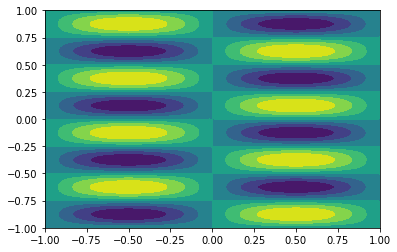

In [3]:
plt.tricontourf(X_true[:,0], X_true[:,1], U_true[:,0], vmin=-1,vmax=1)

In [4]:
X = np.vstack(X_bounds)
U = np.vstack(U_bounds)

idx = np.random.choice( list(range(X_true.shape[0])), size=5000 )
X_df = X_true[idx,:]

lower_bound = np.min(X_true,axis=0)
upper_bound = np.max(X_true,axis=0)

In [5]:
model = Helmholtz(lower_bound, upper_bound, [2,20,20,20,20,20,1],1,4)

In [6]:
model.train_BFGS(X,U,X_df,True)

INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.026689
  Number of iterations: 8378
  Number of functions evaluations: 8953


In [7]:
U_hat = model.predict(X_true)

print("RMSE", np.sqrt(np.mean((U_true[:,0] - U_hat[:,0])**2)) )
print("Relative Error", np.linalg.norm(U_true-U_hat,2)/np.linalg.norm(U_true,2))

RMSE 0.02168774079735927
Relative Error 0.04354558152254096


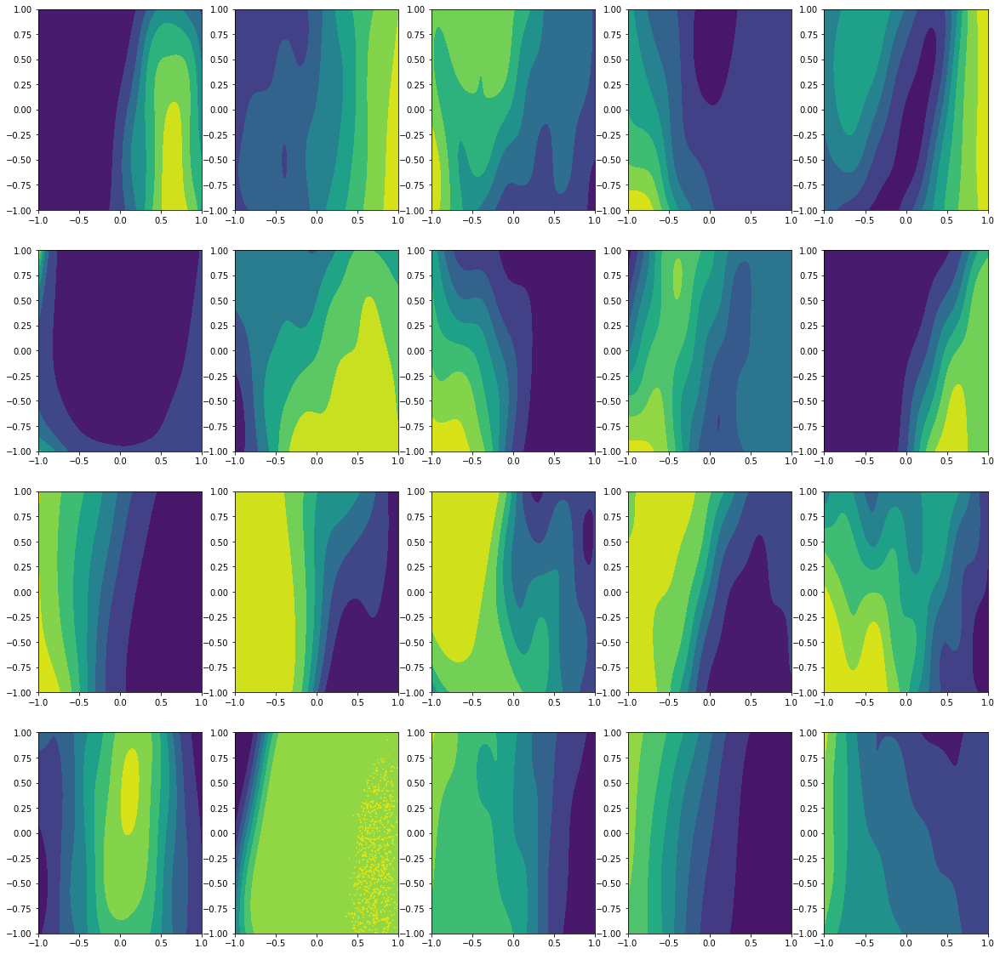

In [12]:
basis_functions = model.get_activations(X_true)[-1]

fig, axes = plt.subplots(4,5, figsize=(20,20))

for row in range(4):
    for col in range(5):
        axes[row,col].tricontourf(X_true[:,1], X_true[:,0], basis_functions[:,row*5 + col])

In [10]:
model = Helmholtz_Soft_Mesh(lower_bound, upper_bound, [2,20,20,20,20,1], [2,20,20,20,20],1,4)
model.train_BFGS(X,U,X_df,True)
U_hat = model.predict(X_true)

print("RMSE", np.sqrt(np.mean((U_true[:,0] - U_hat[:,0])**2)) )
print("Relative Error", np.linalg.norm(U_true-U_hat,2)/np.linalg.norm(U_true,2))

INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.026982
  Number of iterations: 9584
  Number of functions evaluations: 10261
RMSE 0.02710119397159404
Relative Error 0.05441494632727902


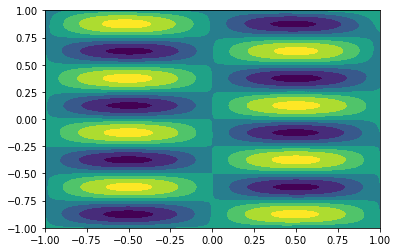

In [11]:
plt.tricontourf(X_true[:,0], X_true[:,1], U_hat[:,0], vmin=-1,vmax=1)

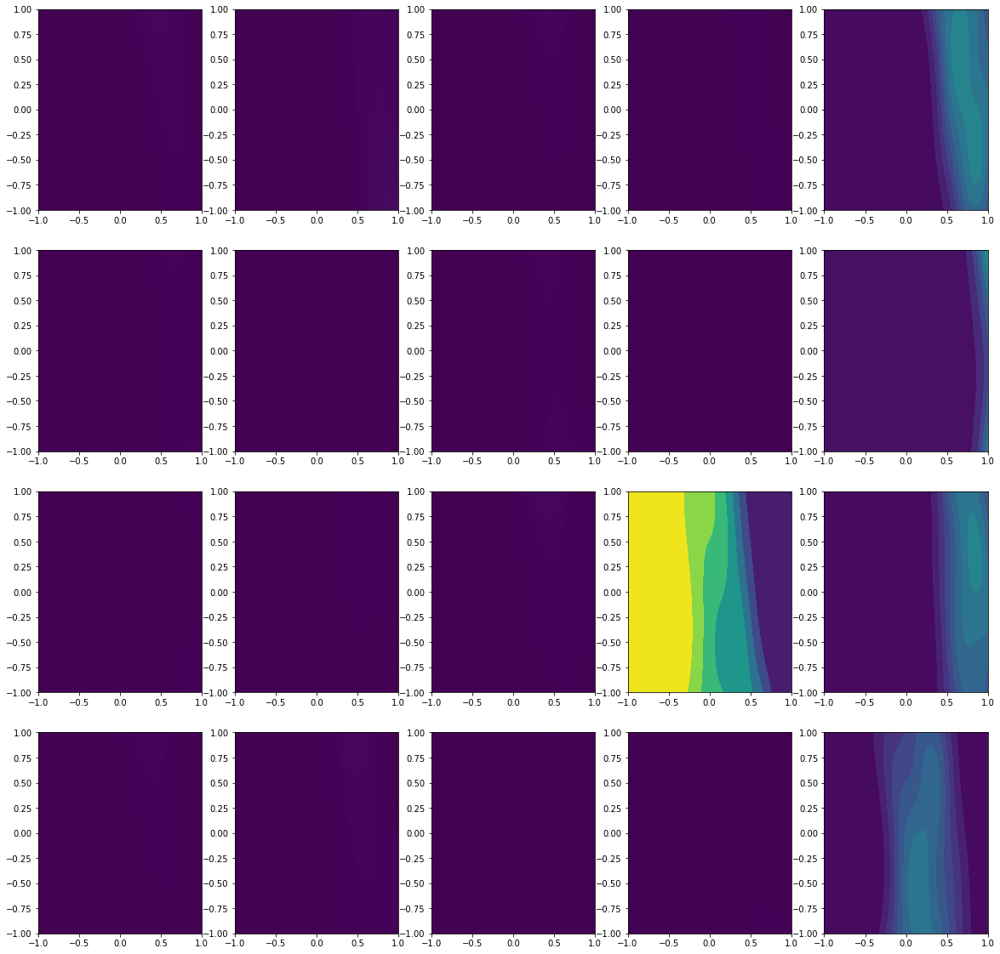

In [14]:
mesh_functions = model.get_probs(X_true)

fig, axes = plt.subplots(4,5, figsize=(20,20))

for row in range(4):
    for col in range(5):
        axes[row,col].tricontourf(X_true[:,1], X_true[:,0], mesh_functions[:,row*5 + col], vmin=0,vmax=1)

In [16]:
model = Helmholtz_Domain_Transformer(lower_bound, upper_bound,30,7,1,4)
model.train_BFGS(X,U,X_df,True)
U_hat = model.predict(X_true)

print("RMSE", np.sqrt(np.mean((U_true[:,0] - U_hat[:,0])**2)) )
print("Relative Error", np.linalg.norm(U_true-U_hat,2)/np.linalg.norm(U_true,2))


INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.024313
  Number of iterations: 7496
  Number of functions evaluations: 8124
RMSE 0.02714411469369815
Relative Error 0.05450112440460178
